[[29.19556006  4.78553451  2.25534887 ...  0.60681228  0.06242164
  -1.09540892]
 [29.11916006  4.10587392  1.40065177 ... -0.06679573 -0.36649954
  -1.24401009]
 [27.86465956  3.42951833  1.63316502 ...  0.14489696 -1.00635118
  -0.61868865]
 ...
 [27.76899051  2.41553994  1.136375   ... -1.39236351  0.13129846
  -0.18597221]
 [29.7431721   2.51801612  0.55527528 ... -1.47598576 -0.8943213
  -1.10962253]
 [29.61288218  2.03417966  0.20642065 ... -1.31031308 -0.40730724
  -0.43229582]]


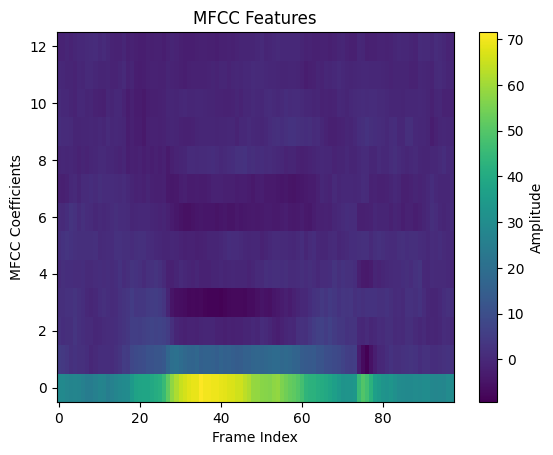

In [ ]:
import numpy as np
import wave

def mfcc_extraction(file_path, sample_rate=16000, frame_length=25, frame_shift=10, num_ceps=13, num_filters=26):
    """
    MFCC 특징 추출 함수.
    """
    with wave.open(file_path, 'r') as wav:
        n_channels, sampwidth, framerate, n_frames, comptype, compname = wav.getparams()
        assert framerate == sample_rate, "샘플링 주파수가 일치하지 않습니다."
        signal = np.frombuffer(wav.readframes(n_frames), dtype=np.int16)

    frame_size = int(sample_rate * frame_length / 1000)
    frame_step = int(sample_rate * frame_shift / 1000)

    def frames(signal, frame_size, frame_step):
        num_frames = 1 + int((len(signal) - frame_size) / frame_step)
        indices = np.tile(np.arange(0, frame_size), (num_frames, 1)) + \
                  np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_size, 1)).T
        return signal[indices.astype(np.int32, copy=False)]

    frames_array = frames(signal, frame_size, frame_step)
    hamming = np.hamming(frame_size)
    windowed_frames = frames_array * hamming

    def mel_filter_bank(num_filters, fft_size, sample_rate):
        mel_min = 0
        mel_max = 2595 * np.log10(1 + (sample_rate / 2) / 700)
        mel_points = np.linspace(mel_min, mel_max, num_filters + 2)
        hz_points = 700 * (10**(mel_points / 2595) - 1)
        bin_points = np.floor((fft_size + 1) * hz_points / sample_rate).astype(int)

        filters = np.zeros((num_filters, int(fft_size / 2 + 1)))
        for i in range(1, num_filters + 1):
            filters[i - 1, bin_points[i - 1]:bin_points[i]] = \
                (np.arange(bin_points[i - 1], bin_points[i]) - bin_points[i - 1]) / (bin_points[i] - bin_points[i - 1])
            filters[i - 1, bin_points[i]:bin_points[i + 1]] = \
                (bin_points[i + 1] - np.arange(bin_points[i], bin_points[i + 1])) / (bin_points[i + 1] - bin_points[i])
        return filters

    fft_size = 512
    mel_filters = mel_filter_bank(num_filters, fft_size, sample_rate)
    spectrum = np.fft.rfft(windowed_frames, n=fft_size)
    power_spectrum = np.square(np.abs(spectrum)) / fft_size
    mel_energy = np.dot(power_spectrum, mel_filters.T)

    mel_log = np.log(mel_energy + 1e-9)
    mfcc = dct(mel_log, num_ceps)

    return mfcc

def dct(x, num_ceps):
    """
    Discrete Cosine Transform (DCT-II) 직접 구현.
    """
    N = x.shape[1]
    K = num_ceps
    dct_matrix = np.zeros((K, N))
    
    for k in range(K):
        for n in range(N):
            dct_matrix[k, n] = np.cos((np.pi / N) * (n + 0.5) * k)
    
    dct_matrix *= np.sqrt(2 / N)
    dct_matrix[0, :] *= 1 / np.sqrt(2)  # k=0의 경우
    
    return np.dot(x, dct_matrix.T)


# 테스트 데이터 처리 예시
file_path = r"D:/Project/scwar/bjasr_sc/data/wav/bird/0ba018fc_nohash_0.wav"  # 실제 데이터 경로로 변경 필요
mfcc_features = mfcc_extraction(file_path)
print(mfcc_features)


In [ ]:
import os
import numpy as np
import wave
from multiprocessing import Pool


bjasr_sc_path=os.path.realpath('D:/Project/scwar/bjasr_sc')

# MFCC 특징 추출 함수
def mfcc_extraction(file_path, sample_rate=16000, frame_length=25, frame_shift=10, num_ceps=13, num_filters=26):
    with wave.open(file_path, 'r') as wav:
        n_channels, sampwidth, framerate, n_frames, comptype, compname = wav.getparams()
        assert framerate == sample_rate, "샘플링 주파수가 일치하지 않습니다."
        signal = np.frombuffer(wav.readframes(n_frames), dtype=np.int16)

    frame_size = int(sample_rate * frame_length / 1000)
    frame_step = int(sample_rate * frame_shift / 1000)

    def frames(signal, frame_size, frame_step):
        num_frames = 1 + int((len(signal) - frame_size) / frame_step)
        indices = np.tile(np.arange(0, frame_size), (num_frames, 1)) + \
                  np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_size, 1)).T
        return signal[indices.astype(np.int32, copy=False)]

    frames_array = frames(signal, frame_size, frame_step)
    hamming = np.hamming(frame_size)
    windowed_frames = frames_array * hamming

    def mel_filter_bank(num_filters, fft_size, sample_rate):
        mel_min = 0
        mel_max = 2595 * np.log10(1 + (sample_rate / 2) / 700)
        mel_points = np.linspace(mel_min, mel_max, num_filters + 2)
        hz_points = 700 * (10**(mel_points / 2595) - 1)
        bin_points = np.floor((fft_size + 1) * hz_points / sample_rate).astype(int)

        filters = np.zeros((num_filters, int(fft_size / 2 + 1)))
        for i in range(1, num_filters + 1):
            filters[i - 1, bin_points[i - 1]:bin_points[i]] = \
                (np.arange(bin_points[i - 1], bin_points[i]) - bin_points[i - 1]) / (bin_points[i] - bin_points[i - 1])
            filters[i - 1, bin_points[i]:bin_points[i + 1]] = \
                (bin_points[i + 1] - np.arange(bin_points[i], bin_points[i + 1])) / (bin_points[i + 1] - bin_points[i])
        return filters

    fft_size = 512
    mel_filters = mel_filter_bank(num_filters, fft_size, sample_rate)
    spectrum = np.fft.rfft(windowed_frames, n=fft_size)
    power_spectrum = np.square(np.abs(spectrum)) / fft_size
    mel_energy = np.dot(power_spectrum, mel_filters.T)

    mel_log = np.log(mel_energy + 1e-9)
    mfcc = dct(mel_log, num_ceps)

    return mfcc

def dct(x, num_ceps):
    N = x.shape[1]
    K = num_ceps
    dct_matrix = np.zeros((K, N))
    
    for k in range(K):
        for n in range(N):
            dct_matrix[k, n] = np.cos((np.pi / N) * (n + 0.5) * k)
    
    dct_matrix *= np.sqrt(2 / N)
    dct_matrix[0, :] *= 1 / np.sqrt(2)  # k=0의 경우
    
    return np.dot(x, dct_matrix.T)

# 병렬 처리를 위한 작업 함수
def process_file(args):
    file_path, output_dir = args
    output_path = os.path.join(output_dir, os.path.basename(file_path) + ".npy")

    mfcc_features = mfcc_extraction(file_path)
    np.save(output_path, mfcc_features)
    return file_path

# 데이터 처리 함수
def process_directory_parallel(input_dir, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    files = [os.path.join(input_dir, f) for f in os.listdir(input_dir) if f.endswith(".wav")]

    with Pool(processes=os.cpu_count()) as pool:
        pool.map(process_file, [(file, output_dir) for file in files])

# 경로 설정
train_input_dir = os.path.join(bjasr_sc_path, "data", "wav")         # 학습 데이터 경로
test_input_dir = os.path.join(bjasr_sc_path, "data", "wav_test")     # 테스트 데이터 경로
train_output_dir = os.path.join(bjasr_sc_path, "features", "train")  # 학습 특징 저장 경로
test_output_dir = os.path.join(bjasr_sc_path, "features", "test")    # 테스트 특징 저장 경로

# 병렬 처리 실행
process_directory_parallel(train_input_dir, train_output_dir)
process_directory_parallel(test_input_dir, test_output_dir)


In [ ]:
# wav.scp 파일 읽기 및 데이터 매핑
def load_wav_scp(scp_file_path):
    mapping = []
    with open(scp_file_path, 'r') as f:
        for line in f:
            identifier, path = line.strip().split()
            mapping.append((identifier, path))
    return mapping

# 파일 처리 함수
def process_file_from_scp(args):
    identifier, file_path, output_dir = args
    # identifier에서 라벨 추출 (예: backward)
    label = identifier.split('/')[0]
    label_dir = os.path.join(output_dir, label)
    os.makedirs(label_dir, exist_ok=True)
    
    # 출력 파일 경로
    output_file = os.path.join(label_dir, os.path.basename(file_path) + ".npy")
    
    # MFCC 추출
    mfcc_features = mfcc_extraction(file_path)
    np.save(output_file, mfcc_features)
    return file_path, label

# 데이터 처리 함수
def process_wav_scp(scp_file_path, output_dir):
    # scp 파일 로드
    wav_mapping = load_wav_scp(scp_file_path)
    
    # 병렬 처리
    with Pool(processes=os.cpu_count()) as pool:
        pool.map(process_file_from_scp, [(identifier, file_path, output_dir) for identifier, file_path in wav_mapping])

# 경로 설정
wav_scp_file = "/mnt/data/wav.scp"  # wav.scp 파일 경로
output_dir = r"D:\Project\scwar\bjasr_sc\features\train"  # 출력 디렉토리

# wav.scp 기반 데이터 처리 실행
process_wav_scp(wav_scp_file, output_dir)


In [38]:
import os

def rename_files_in_folder(folder_path, prefix):
    """
    Rename all files in the folder with a sequential numbering format.

    Args:
        folder_path (str): Path to the folder containing files.
        prefix (str): Prefix for the renamed files.
    """
    files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    files.sort()  # Sort files to ensure consistent ordering

    for i, file_name in enumerate(files, start=1):
        old_path = os.path.join(folder_path, file_name)
        new_name = f"{prefix}_{i}.wav"
        new_path = os.path.join(folder_path, new_name)
        
        # Rename the file
        os.rename(old_path, new_path)
        print(f"Renamed: {old_path} -> {new_path}")

# Example usage
folder_path = r"D:\Dataset\scwar\data\zero"  # Replace with your folder path
prefix = "zero"
rename_files_in_folder(folder_path, prefix)


Renamed: D:\Dataset\scwar\data\zero\004ae714_nohash_0.wav -> D:\Dataset\scwar\data\zero\zero_1.wav
Renamed: D:\Dataset\scwar\data\zero\004ae714_nohash_1.wav -> D:\Dataset\scwar\data\zero\zero_2.wav
Renamed: D:\Dataset\scwar\data\zero\012c8314_nohash_0.wav -> D:\Dataset\scwar\data\zero\zero_3.wav
Renamed: D:\Dataset\scwar\data\zero\012c8314_nohash_1.wav -> D:\Dataset\scwar\data\zero\zero_4.wav
Renamed: D:\Dataset\scwar\data\zero\0132a06d_nohash_0.wav -> D:\Dataset\scwar\data\zero\zero_5.wav
Renamed: D:\Dataset\scwar\data\zero\0132a06d_nohash_1.wav -> D:\Dataset\scwar\data\zero\zero_6.wav
Renamed: D:\Dataset\scwar\data\zero\0132a06d_nohash_2.wav -> D:\Dataset\scwar\data\zero\zero_7.wav
Renamed: D:\Dataset\scwar\data\zero\0132a06d_nohash_3.wav -> D:\Dataset\scwar\data\zero\zero_8.wav
Renamed: D:\Dataset\scwar\data\zero\0137b3f4_nohash_0.wav -> D:\Dataset\scwar\data\zero\zero_9.wav
Renamed: D:\Dataset\scwar\data\zero\0137b3f4_nohash_1.wav -> D:\Dataset\scwar\data\zero\zero_10.wav
Renamed: 

In [39]:
import os
import shutil
import random

def split_dataset_by_class(source_base_folder, output_base_folder, train_ratio=0.7, val_ratio=0.2, test_ratio=0.1):
    """
    Split dataset by class into train, validation, and test sets.

    Args:
        source_base_folder (str): Base folder containing class subfolders.
        output_base_folder (str): Folder to store the train, validation, and test sets.
        train_ratio (float): Ratio of training data.
        val_ratio (float): Ratio of validation data.
        test_ratio (float): Ratio of test data.
    """
    # Create output folders
    train_folder = os.path.join(output_base_folder, 'train')
    val_folder = os.path.join(output_base_folder, 'validation')
    test_folder = os.path.join(output_base_folder, 'test')
    os.makedirs(train_folder, exist_ok=True)
    os.makedirs(val_folder, exist_ok=True)
    os.makedirs(test_folder, exist_ok=True)

    # Process each class folder
    for class_name in os.listdir(source_base_folder):
        class_folder = os.path.join(source_base_folder, class_name)
        if not os.path.isdir(class_folder):
            continue  # Skip non-folder items

        print(f"Processing class: {class_name}")
        files = [f for f in os.listdir(class_folder) if f.endswith('.wav')]
        random.shuffle(files)

        # Calculate split indices
        total_files = len(files)
        train_end = int(total_files * train_ratio)
        val_end = train_end + int(total_files * val_ratio)

        # Split files
        train_files = files[:train_end]
        val_files = files[train_end:val_end]
        test_files = files[val_end:]

        # Create class subfolders in output folders
        os.makedirs(os.path.join(train_folder, class_name), exist_ok=True)
        os.makedirs(os.path.join(val_folder, class_name), exist_ok=True)
        os.makedirs(os.path.join(test_folder, class_name), exist_ok=True)

        # Move files to respective folders
        for file in train_files:
            shutil.copy(os.path.join(class_folder, file), os.path.join(train_folder, class_name, file))
        for file in val_files:
            shutil.copy(os.path.join(class_folder, file), os.path.join(val_folder, class_name, file))
        for file in test_files:
            shutil.copy(os.path.join(class_folder, file), os.path.join(test_folder, class_name, file))

        print(f"Class {class_name}: Train={len(train_files)}, Validation={len(val_files)}, Test={len(test_files)}")

    print("Dataset splitting completed.")

# Example usage
source_base_folder = "D:/Dataset/scwar/data"  # Path to the folder containing class subfolders
output_base_folder = "D:/Dataset/scwar/split"  # Path to the output folder
split_dataset_by_class(source_base_folder, output_base_folder)


Processing class: backward
Class backward: Train=1164, Validation=332, Test=168
Processing class: bed
Class bed: Train=1409, Validation=402, Test=203
Processing class: bird
Class bird: Train=1444, Validation=412, Test=208
Processing class: cat
Class cat: Train=1421, Validation=406, Test=204
Processing class: dog
Class dog: Train=1489, Validation=425, Test=214
Processing class: down
Class down: Train=2741, Validation=783, Test=393
Processing class: eight
Class eight: Train=2650, Validation=757, Test=380
Processing class: five
Class five: Train=2836, Validation=810, Test=406
Processing class: follow
Class follow: Train=1105, Validation=315, Test=159
Processing class: forward
Class forward: Train=1089, Validation=311, Test=157
Processing class: four
Class four: Train=2609, Validation=745, Test=374
Processing class: go
Class go: Train=2716, Validation=776, Test=388
Processing class: happy
Class happy: Train=1437, Validation=410, Test=207
Processing class: house
Class house: Train=1479, Val

In [40]:
import os
import shutil

def merge_files_to_single_folder(base_dir, output_dir):
    """
    Merge all files from subdirectories into a single directory.

    Args:
        base_dir (str): The base directory containing subdirectories.
        output_dir (str): The directory where all files will be merged.
    """
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    for root, dirs, files in os.walk(base_dir):
        for file in files:
            if file.endswith(".wav"):  # Only process WAV files
                src_path = os.path.join(root, file)
                dest_path = os.path.join(output_dir, file)
                
                # Avoid overwriting files with the same name
                if os.path.exists(dest_path):
                    base_name, ext = os.path.splitext(file)
                    counter = 1
                    while os.path.exists(dest_path):
                        dest_path = os.path.join(output_dir, f"{base_name}_{counter}{ext}")
                        counter += 1

                shutil.copy(src_path, dest_path)
                print(f"Copied: {src_path} -> {dest_path}")

# Example usage:
base_dir = "D:/Dataset/scwar/data/train"  # Directory with subdirectories
output_dir = "D:/Dataset/scwar/data/train"  # Target directory

merge_files_to_single_folder(base_dir, output_dir)


Copied: D:/Dataset/scwar/data/train\backward\backward_1.wav -> D:/Dataset/scwar/data/train\backward_1.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_100.wav -> D:/Dataset/scwar/data/train\backward_100.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_1000.wav -> D:/Dataset/scwar/data/train\backward_1000.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_1002.wav -> D:/Dataset/scwar/data/train\backward_1002.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_1003.wav -> D:/Dataset/scwar/data/train\backward_1003.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_1004.wav -> D:/Dataset/scwar/data/train\backward_1004.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_1005.wav -> D:/Dataset/scwar/data/train\backward_1005.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_1006.wav -> D:/Dataset/scwar/data/train\backward_1006.wav
Copied: D:/Dataset/scwar/data/train\backward\backward_1007.wav -> D:/Dataset/scwar/data/train\backward_1007.wav


In [41]:
import os
import shutil

def merge_files_to_single_folder(base_dir, output_dir):
    """
    Merge all files from subdirectories into a single directory.

    Args:
        base_dir (str): The base directory containing subdirectories.
        output_dir (str): The directory where all files will be merged.
    """
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    for root, dirs, files in os.walk(base_dir):
        for file in files:
            if file.endswith(".wav"):  # Only process WAV files
                src_path = os.path.join(root, file)
                dest_path = os.path.join(output_dir, file)
                
                # Avoid overwriting files with the same name
                if os.path.exists(dest_path):
                    base_name, ext = os.path.splitext(file)
                    counter = 1
                    while os.path.exists(dest_path):
                        dest_path = os.path.join(output_dir, f"{base_name}_{counter}{ext}")
                        counter += 1

                shutil.copy(src_path, dest_path)
                print(f"Copied: {src_path} -> {dest_path}")

# Example usage:
base_dir = "D:/Dataset/scwar/data/test"  # Directory with subdirectories
output_dir = "D:/Dataset/scwar/data/test"  # Target directory

merge_files_to_single_folder(base_dir, output_dir)


Copied: D:/Dataset/scwar/data/test\backward\backward_10.wav -> D:/Dataset/scwar/data/test\backward_10.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1010.wav -> D:/Dataset/scwar/data/test\backward_1010.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1029.wav -> D:/Dataset/scwar/data/test\backward_1029.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1038.wav -> D:/Dataset/scwar/data/test\backward_1038.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1043.wav -> D:/Dataset/scwar/data/test\backward_1043.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1055.wav -> D:/Dataset/scwar/data/test\backward_1055.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1066.wav -> D:/Dataset/scwar/data/test\backward_1066.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1067.wav -> D:/Dataset/scwar/data/test\backward_1067.wav
Copied: D:/Dataset/scwar/data/test\backward\backward_1075.wav -> D:/Dataset/scwar/data/test\backward_1075.wav
Copied: D:/Dat

In [42]:
import os
import shutil

def merge_files_to_single_folder(base_dir, output_dir):
    """
    Merge all files from subdirectories into a single directory.

    Args:
        base_dir (str): The base directory containing subdirectories.
        output_dir (str): The directory where all files will be merged.
    """
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    for root, dirs, files in os.walk(base_dir):
        for file in files:
            if file.endswith(".wav"):  # Only process WAV files
                src_path = os.path.join(root, file)
                dest_path = os.path.join(output_dir, file)
                
                # Avoid overwriting files with the same name
                if os.path.exists(dest_path):
                    base_name, ext = os.path.splitext(file)
                    counter = 1
                    while os.path.exists(dest_path):
                        dest_path = os.path.join(output_dir, f"{base_name}_{counter}{ext}")
                        counter += 1

                shutil.copy(src_path, dest_path)
                print(f"Copied: {src_path} -> {dest_path}")

# Example usage:
base_dir = "D:/Dataset/scwar/data/validation"  # Directory with subdirectories
output_dir = "D:/Dataset/scwar/data/validation"  # Target directory

merge_files_to_single_folder(base_dir, output_dir)


Copied: D:/Dataset/scwar/data/validation\backward\backward_1001.wav -> D:/Dataset/scwar/data/validation\backward_1001.wav
Copied: D:/Dataset/scwar/data/validation\backward\backward_1011.wav -> D:/Dataset/scwar/data/validation\backward_1011.wav
Copied: D:/Dataset/scwar/data/validation\backward\backward_1014.wav -> D:/Dataset/scwar/data/validation\backward_1014.wav
Copied: D:/Dataset/scwar/data/validation\backward\backward_1015.wav -> D:/Dataset/scwar/data/validation\backward_1015.wav
Copied: D:/Dataset/scwar/data/validation\backward\backward_1025.wav -> D:/Dataset/scwar/data/validation\backward_1025.wav
Copied: D:/Dataset/scwar/data/validation\backward\backward_1026.wav -> D:/Dataset/scwar/data/validation\backward_1026.wav
Copied: D:/Dataset/scwar/data/validation\backward\backward_1028.wav -> D:/Dataset/scwar/data/validation\backward_1028.wav
Copied: D:/Dataset/scwar/data/validation\backward\backward_1034.wav -> D:/Dataset/scwar/data/validation\backward_1034.wav
Copied: D:/Dataset/scwar

In [ ]:
# -*- coding: utf-8 -*-
import os
import numpy as np

def compute_global_mean_std(feature_dir):
    """
    Compute the global mean and standard deviation across all feature files in a directory.

    Args:
        feature_dir (str): Path to the directory containing .bin feature files.
    
    Returns:
        global_mean (np.ndarray): Global mean vector.
        global_std (np.ndarray): Global standard deviation vector.
    """
    # Collect all feature files in the directory
    feature_files = [os.path.join(feature_dir, f) for f in os.listdir(feature_dir) if f.endswith('.bin')]

    if not feature_files:
        raise FileNotFoundError("No feature files found in the directory.")
    
    print(f"Found {len(feature_files)} feature files.")

    # Initialize lists to store data
    all_features = []

    for file_path in feature_files:
        # Load the binary data
        data = np.fromfile(file_path, dtype=np.float32)
        
        #######################
        # Assuming 23 features per frame (FBANK format)
        # Change this if using a different feature dimension.
        feature_dim = 23
        #######################
        
        try:
            # Reshape the data based on the assumed feature dimension
            data = data.reshape(-1, feature_dim)
        except ValueError:
            print(f"Error reshaping data in file: {file_path}. Skipping this file.")
            continue
        
        all_features.append(data)

    # Concatenate all features into a single array
    all_features = np.vstack(all_features)

    # Compute global mean and standard deviation
    global_mean = np.mean(all_features, axis=0)
    global_std = np.std(all_features, axis=0)

    return global_mean, global_std

if __name__ == "__main__":
    #######################
    # Path to the directory containing feature .bin files
    feature_dir = '../features/train'  
    #######################
    
    global_mean, global_std = compute_global_mean_std(feature_dir)

    print("Global Mean:", global_mean)
    print("Global Std:", global_std)

    #######################
    # Save the results for later use
    np.save(os.path.join(feature_dir, 'global_mean.npy'), global_mean)
    np.save(os.path.join(feature_dir, 'global_std.npy'), global_std)
    #######################
    
    print(f"Global mean and std saved in: {feature_dir}")


FileNotFoundError: No feature files found in the directory.

In [ ]:
!cd 

In [51]:
%pwd

'd:\\Project\\scwar\\bjasr_sc'

In [53]:
import os

def load_word_to_phoneme_map(dic_file):
    """
    sc35.dic 파일에서 단어-음소 매핑을 로드합니다.
    Args:
        dic_file (str): Dictionary file path.
    Returns:
        dict: 단어와 음소 표현의 매핑.
    """
    word_to_phoneme = {}
    with open(dic_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 2:
                continue
            word = parts[0].lower()
            phonemes = parts[1:]
            word_to_phoneme[word] = phonemes
    return word_to_phoneme

def create_text_phone(data_dir, dic_file, output_file):
    """
    74063개의 파일에 대해 text_phone 파일을 생성합니다.
    Args:
        data_dir (str): 데이터 파일이 저장된 디렉토리.
        dic_file (str): 단어-음소 매핑 파일 (sc35.dic).
        output_file (str): 생성된 text_phone 파일 경로.
    """
    # 단어-음소 매핑 로드
    word_to_phoneme = load_word_to_phoneme_map(dic_file)
    
    with open(output_file, 'w') as f_out:
        for subdir, _, files in os.walk(data_dir):
            for file_name in files:
                if file_name.endswith('.wav'):
                    # 파일 이름에서 발화 ID 추출
                    utterance_id = os.path.splitext(file_name)[0]
                    # 파일 이름에서 단어 추출 (예: backward_1 -> backward)
                    word = file_name.split('_')[0].lower()
                    
                    if word in word_to_phoneme:
                        phonemes = word_to_phoneme[word]
                        # 발화 ID와 음소 표현을 기록
                        f_out.write(f"{utterance_id} {' '.join(phonemes)}\n")
                    else:
                        print(f"Word not found in dictionary: {word}")
                        continue

if __name__ == "__main__":
    # 데이터 파일 경로
    data_dir = r'D:/Dataset/scwar/data/validation'
    # sc35.dic 파일 경로
    dic_file = r'D:/Dataset/scwar/03gmm_hmm/sc35.dic'
    # 출력될 text_phone 파일 경로
    output_file = os.path.realpath('D:/Dataset/scwar/data/label/val/text_phone')
    
    os.makedirs(os.path.dirname(output_file), exist_ok=True)
    create_text_phone(data_dir, dic_file, output_file)
    print(f"text_phone file created at: {output_file}")


text_phone file created at: D:\Dataset\scwar\data\label\val\text_phone


In [56]:
# -*- coding: utf-8 -*-

# os 모듈을 임포트
import os

def phone_to_int(label_str, label_int, phone_list, insert_sil=False):
    ''' 
    음소 리스트를 사용하여 라벨 파일을 숫자로 변환합니다.
    label_str: 입력 라벨 파일 경로 (text_phone)
    label_int: 출력 숫자 라벨 파일 경로
    phone_list: 음소 리스트
    insert_sil: True일 경우, 시작과 끝에 포즈를 삽입합니다.
    '''
    with open(label_str, mode='r') as f_in, open(label_int, mode='w') as f_out:
        for line in f_in:
            text = line.split()
            f_out.write('%s' % text[0])  # 발화 ID
            
            if insert_sil:
                f_out.write(' 0')  # 포즈 삽입

            for u in text[1:]:
                if u not in phone_list:
                    print(f"Unknown phone: {u}")
                    continue
                f_out.write(f" {phone_list.index(u)}")
            
            if insert_sil:
                f_out.write(' 0')  # 포즈 삽입
            
            f_out.write('\n')


if __name__ == "__main__":
    # 음소 리스트 파일 (cmu39.txt)
    phone_file = os.path.realpath('D:/Dataset/scwar/03gmm_hmm/cmu39.txt')
    silence_phone = 'pau'
    insert_sil = True

    # Validation 데이터의 text_phone 파일 경로
    label_val_str = os.path.realpath('D:/Dataset/scwar/data/label/val/text_phone')

    # 출력 디렉토리 및 파일
    out_val_dir = os.path.realpath('D:/Dataset/scwar/data/label/val')
    label_val_int = os.path.join(out_val_dir, 'text_int')
    
    os.makedirs(out_val_dir, exist_ok=True)

    # 음소 리스트 생성
    phone_list = [silence_phone]
    with open(phone_file, mode='r') as f:
        phone_list.extend([line.strip() for line in f if line.strip()])

    # text_phone 파일을 숫자 라벨로 변환
    phone_to_int(label_val_str, label_val_int, phone_list, insert_sil)
    print(f"Validation numeric labels saved to: {label_val_int}")


Validation numeric labels saved to: D:\Dataset\scwar\data\label\val\text_int


In [55]:
%pwd

'd:\\Project\\scwar\\bjasr_sc'

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/data/Log_Likelihood_Convergence.png'

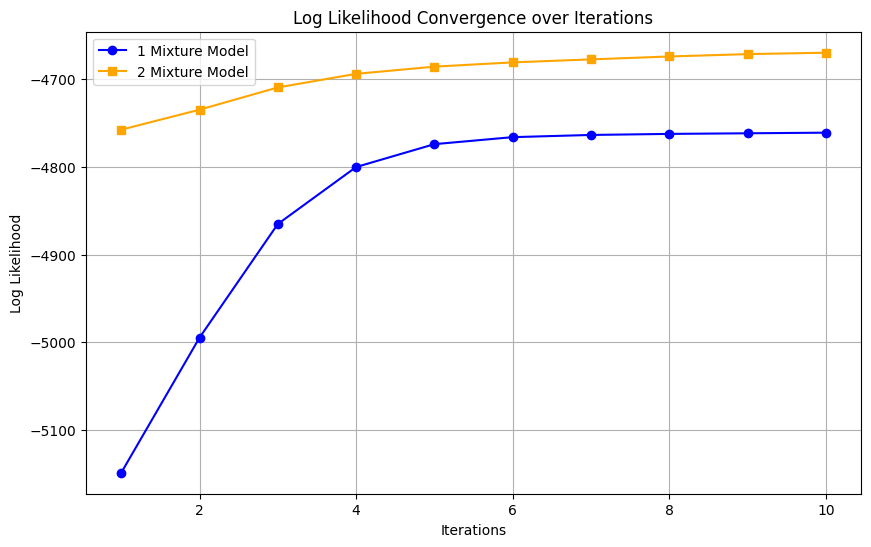

In [57]:
import matplotlib.pyplot as plt

# Data for visualization
iterations = list(range(1, 11))  # 10 iterations
log_likelihood_1_mixture = [-5148.9, -4994.8, -4865.2, -4800.2, -4774.1, -4766.1, -4763.6, -4762.4, -4761.7, -4761.0]
log_likelihood_2_mixture = [-4757.6, -4734.8, -4709.4, -4693.9, -4685.7, -4680.8, -4677.4, -4674.1, -4671.4, -4669.8]

# Plotting the graph
plt.figure(figsize=(10, 6))
plt.plot(iterations, log_likelihood_1_mixture, marker='o', label='1 Mixture Model', color='blue')
plt.plot(iterations, log_likelihood_2_mixture, marker='s', label='2 Mixture Model', color='orange')
plt.xlabel('Iterations')
plt.ylabel('Log Likelihood')
plt.title('Log Likelihood Convergence over Iterations')
plt.legend()
plt.grid()

# Save the plot as an image file and provide a link
plot_path = "/mnt/data/Log_Likelihood_Convergence.png"
plt.savefig(plot_path)
plt.close()

plot_path

In [ ]:
import os

# bin 파일이 저장된 디렉토리
feature_dir = os.path.realpath('D:/Dataset/scwar/features/test')  # 테스트 데이터 경로
output_scp_path = os.path.realpath('D:/Dataset/scwar/01compute_features/mfcc/test/feats.scp')

# 출력 디렉토리가 존재하지 않을 경우 생성
output_dir = os.path.dirname(output_scp_path)
os.makedirs(output_dir, exist_ok=True)

# feats.scp 생성
with open(output_scp_path, 'w') as scp_file:
    for file in os.listdir(feature_dir):
        if file.endswith('.bin'):  # bin 파일만 처리
            utterance_id = os.path.splitext(file)[0]  # 파일명에서 확장자 제거
            file_path = os.path.join(feature_dir, file)  # 전체 경로 생성
            scp_file.write(f"{utterance_id} {file_path}\n")

print(f"feats.scp generated at {output_scp_path}")


feats.scp generated at D:\Dataset\scwar\01compute_features\mfcc\test\feats.scp


In [71]:
import os
import numpy as np

# bin 파일이 저장된 디렉토리
feature_dir = 'D:/Dataset/scwar/features/test'
# 출력될 feats.scp 파일 경로
output_scp_path = 'D:/Dataset/scwar/feats.scp'

# feats.scp 생성
with open(output_scp_path, 'w') as scp_file:
    for file in os.listdir(feature_dir):
        if file.endswith('.bin'):  # bin 파일만 처리
            utterance_id = os.path.splitext(file)[0]  # 파일명에서 확장자 제거
            file_path = os.path.join(feature_dir, file)  # 전체 경로 생성
            
            # bin 파일에서 차원 추출
            try:
                data = np.fromfile(file_path, dtype=np.float32)
                num_frames = len(data)  # 총 데이터 개수
                num_dims = 13  # HMM에서 정의된 차원으로 설정 (필요에 따라 수정)
            except Exception as e:
                print(f"Error reading file {file_path}: {e}")
                continue
            
            # feats.scp에 기록
            scp_file.write(f"{utterance_id} {file_path} 0 {num_dims}\n")

print(f"feats.scp generated at {output_scp_path}")


feats.scp generated at D:/Dataset/scwar/feats.scp


In [66]:
%pwd

'd:\\Project\\scwar\\bjasr_sc'

In [70]:
from hmmfunc import MonoPhoneHMM

hmm = MonoPhoneHMM()
hmm.load_hmm('D:/Project/scwar/bjasr_sc/exp/model_3state_2mix/10.hmm')
print(f"Expected number of dimensions: {hmm.num_dims}")


Expected number of dimensions: 13


In [ ]:
# -*- coding: utf-8 -*-

# 
# MFCC 특징을 계산합니다.
# 

# wav 데이터를 읽기 위한 모듈(wave)을 임포트
import wave

# 수치 연산 모듈(numpy)을 임포트
import numpy as np

# os, sys 모듈을 임포트
import os
import sys

class FeatureExtractor():
    '''특징량(FBANK, MFCC)을 추출하는 클래스
    sample_frequency: 입력 파형의 샘플링 주파수 [Hz]
    frame_length: 프레임 크기 [밀리초]
    frame_shift: 분석 간격(프레임 시프트) [밀리초]
    num_mel_bins: 멜 필터 뱅크의 개수(=FBANK 특징의 차원 수)
    num_ceps: MFCC 특징의 차원 수(0차원 포함)
    lifter_coef: 리프터링 처리의 파라미터
    low_frequency: 저주파 대역 제거의 컷오프 주파수 [Hz]
    high_frequency: 고주파 대역 제거의 컷오프 주파수 [Hz]
    dither: 디더링 처리의 파라미터(잡음의 세기) 
    '''
    # 클래스를 호출할 때 처음에 한 번 실행되는 함수
    def __init__(self, 
                 sample_frequency=16000, 
                 frame_length=25, 
                 frame_shift=10, 
                 num_mel_bins=23, 
                 num_ceps=13, 
                 lifter_coef=22, 
                 low_frequency=20, 
                 high_frequency=8000, 
                 dither=1.0):
        # 샘플링 주파수[Hz]
        self.sample_freq = sample_frequency
        # 창 길이를 밀리초에서 샘플 수로 변환
        self.frame_size = int(sample_frequency * frame_length * 0.001)
        # 프레임 시프트를 밀리초에서 샘플 수로 변환
        self.frame_shift = int(sample_frequency * frame_shift * 0.001)
        # 멜 필터 뱅크의 개수
        self.num_mel_bins = num_mel_bins
        # MFCC의 차원 수 (0차 포함)
        self.num_ceps = num_ceps
        # 리프터링 매개변수
        self.lifter_coef = lifter_coef
        # 저주파수 대역 제거 절단 주파수[Hz]
        self.low_frequency = low_frequency
        # 고주파수 대력 제거 절단 주파수[Hz]
        self.high_frequency = high_frequency
        # 디더링 개수
        self.dither_coef = dither

        # FFT 포인트 수 = 창폭 이상의 2제곱
        self.fft_size = 1
        while self.fft_size < self.frame_size:
            self.fft_size *= 2

        # 멜 필터뱅크를 생성
        self.mel_filter_bank = self.MakeMelFilterBank()

        # 이산 코사인 변환(DCT) 기저 행렬을 생성
        self.dct_matrix = self.MakeDCTMatrix()

        # 리프터(lifter) 생성
        self.lifter = self.MakeLifter()


    def Herz2Mel(self, herz):
        ''' 주파수를 헤르츠에서 Mel로 변환
        '''
        return (1127.0 * np.log(1.0 + herz / 700))


    def MakeMelFilterBank(self):
        ''' Mel 필터 뱅크 생성
        '''
        # 멜 축의 최대 주파수
        mel_high_freq = self.Herz2Mel(self.high_frequency)
        # 멜 축의 최소 주파수
        mel_low_freq = self.Herz2Mel(self.low_frequency)
        # 최소에서 최대 주파수까지
        # Mel 축 위에서 동일 간격으로 주파수를 취한다
        mel_points = np.linspace(mel_low_freq, 
                                 mel_high_freq, 
                                 self.num_mel_bins+2)

        # 파워 스펙트럼의 차원 수 = FFT 크기/2+1
        # ※Kald의 구현에서는 나이퀴스트 주파수 성분(마지막+1)은
        # 버리고 있지만, 본 구현에서는 버리지 않고 사용하고 있음
        dim_spectrum = int(self.fft_size / 2) + 1

        # 멜 필터 뱅크(필터 수 x 스펙트럼 차원 수)
        mel_filter_bank = np.zeros((self.num_mel_bins, dim_spectrum))
        for m in range(self.num_mel_bins):
            # 삼각 필터의 왼쪽 끝, 중심, 오른쪽 끝의 멜 주파수
            left_mel = mel_points[m]
            center_mel = mel_points[m+1]
            right_mel = mel_points[m+2]
            # 파워 스펙트럼의 각 bin에 대응하는 가중치를 계산
            for n in range(dim_spectrum):
                # 각 빈에 해당하는 헤르츠 축 주파수를 계산
                freq = 1.0 * n * self.sample_freq/2 / dim_spectrum
                # Mel 주파수로 변환
                mel = self.Herz2Mel(freq)
                # 그 빈이 삼각 필터 범위에 들어가면 가중치를 계산
                if mel > left_mel and mel < right_mel:
                    if mel <= center_mel:
                        weight = (mel - left_mel) / (center_mel - left_mel)
                    else:
                        weight = (right_mel-mel) / (right_mel-center_mel)
                    mel_filter_bank[m][n] = weight
         
        return mel_filter_bank

    
    def ExtractWindow(self, waveform, start_index, num_samples):
        '''
        1프레임 분량의 파형 데이터를 추출하여 전처리하고,
        로그 파워값을 계산
        '''
        # waveform에서 1프레임 분량의 파형 추출
        window = waveform[start_index:start_index + self.frame_size].copy()

        # 디더링을 수행
        # (-dither_coef～dither_coef 사이 값을 난수로 추가)
        if self.dither_coef > 0:
            window = window \
                     + np.random.rand(self.frame_size) \
                     * (2*self.dither_coef) - self.dither_coef

        # 직류 성분을 제거
        window = window - np.mean(window)

        # 아래 처리를 실행하기 전에 파워 계산
        power = np.sum(window ** 2)
        # 로그 계산 시 -inf가 출력되지 않도록 플로어링 처리
        if power < 1E-10:
            power = 1E-10
        # 로그를 취한다
        log_power = np.log(power)

        # 프리엠퍼시스(고주파 강조)
        # window[i] = 1.0 * window[i] - 0.97 * window[i-1]
        window = np.convolve(window,np.array([1.0, -0.97]), mode='same')
        # numpy.convolve는 0번째 요소가 처리되지 않기
        # (window[i-1]가 없기) 때문에
        # window[0-1]을window[0]로 대체하여 처리
        window[0] -= 0.97*window[0]

        # 해밍 창을 적용
        # hamming[i] = 0.54 - 0.46 * np.cos(2*np.pi*i / (self.frame_size - 1))
        window *= np.hamming(self.frame_size)

        return window, log_power


    def ComputeFBANK(self, waveform):
        '''로그 Mel 필터뱅크특징(FBANK) 계산
        출력1: fbank_features: 로그 Mel 필터뱅크 특징
        출력2: log_power: 로그 파워 값(MFCC 추출 시에 사용)
        '''
        # 파형 데이터 총 샘플 수
        num_samples = np.size(waveform)
        # 특징값의 총 프레임 수를 계산
        num_frames = (num_samples - self.frame_size) // self.frame_shift + 1
        # Mel 필터 뱅크 특징
        fbank_features = np.zeros((num_frames, self.num_mel_bins))
        # 로그 파워(MFCC 특징을 구할 때 사용됨)
        log_power = np.zeros(num_frames)

        # 1프레임 마다 특징값 계산
        for frame in range(num_frames):
            # 분석 시작 위치는 프레임 번호(0에서 시작)*프레임 시프트
            start_index = frame * self.frame_shift
            # 1프레임 분량의 파형을 추출하여 전처리 수행
            # 로그 파워 값 계산
            window, log_pow = self.ExtractWindow(waveform, start_index, num_samples)
            
            # 고속 푸리에 변환(FFT)을 실행
            spectrum = np.fft.fft(window, n=self.fft_size)
            # FFT 결과의 오른쪽 절반(음의 주파수 성분)을 제거
            # ※Kald의 구현에서는 나이퀴스트 주파수 성분(마지막+1)은 버리고 있지만,
            # 본 구현에서는 버리지 않고 사용하고 있음
            spectrum = spectrum[:int(self.fft_size/2) + 1]

            # 파워 스펙트럼을 계산
            spectrum = np.abs(spectrum) ** 2

            # Mel 필터뱅크 계산
            fbank = np.dot(spectrum, self.mel_filter_bank.T)

            # 로그 계산 시 -inf가 출력되지 않도록 플로어링 처리
            fbank[fbank<0.1] = 0.1

            # 로그를 취해서 fbank_features에 첨부
            fbank_features[frame] = np.log(fbank)

            # 로그 파워 값을 log_power에 첨부
            log_power[frame] = log_pow

        return fbank_features, log_power


    def MakeDCTMatrix(self):
        ''' 이산 코사인 변환(DCT)의 기저 행렬 작성
        '''
        N = self.num_mel_bins
        # DCT 기저행렬(기저수(=MFCC 차원수) x FBANK 차원수)
        dct_matrix = np.zeros((self.num_ceps,self.num_mel_bins))
        for k in range(self.num_ceps):
            if k == 0:
                dct_matrix[k] = np.ones(self.num_mel_bins) * 1.0 / np.sqrt(N)
            else:
                dct_matrix[k] = np.sqrt(2/N) \
                    * np.cos(((2.0*np.arange(N)+1)*k*np.pi) / (2*N))

        return dct_matrix


    def MakeLifter(self):
        ''' 리프터 계산
        '''
        Q = self.lifter_coef
        I = np.arange(self.num_ceps)
        lifter = 1.0 + 0.5 * Q * np.sin(np.pi * I / Q)
        return lifter


    def ComputeMFCC(self, waveform):
        ''' MFCC 계산
        '''
        # FBANK 및 로그 파워 계산
        fbank, log_power = self.ComputeFBANK(waveform)
        
        # DCT 기저 행렬과의 곱셈으로 DCT 계산
        mfcc = np.dot(fbank, self.dct_matrix.T)

        # 리프터링
        mfcc *= self.lifter

        # MFCC의 0차원 값을 전처리하기 전에 파형 로그 파워로 치환
        mfcc[:,0] = log_power

        return mfcc

# 
# 메인 함수

def simplify_wav_scp_labels_only(input_scp_path, output_scp_path):
    """
    Simplify wav.scp to include only the label and file identifier (space-separated).

    Args:
        input_scp_path (str): Original wav.scp file path.
        output_scp_path (str): Simplified wav.scp file path.
    """
    with open(input_scp_path, 'r') as infile, open(output_scp_path, 'w') as outfile:
        for line in infile:
            identifier, _ = line.strip().split()
            label, filename = identifier.split('/', 1)
            outfile.write(f"{label} {filename}\n")

# File paths
input_wav_scp = "../data/wav.scp"
output_wav_scp = "../data/wav2.scp"

# Simplify wav.scp to include only labels and filenames
simplify_wav_scp_labels_only(input_wav_scp, output_wav_scp)

print(f"Simplified wav.scp file created: {output_wav_scp}")








if __name__ == "__main__":
    
    # 
    # 설정 시작
    # 

    # 각 wav 파일의 리스트와 특징량 출력 위치
    train_wav_scp = '../data/label/train/wav2.scp' ##################   wav.scp에서 필요없는 부분 제거한 wav2.scp 파일
    train_out_dir = './mfcc/train'
    #dev_wav_scp = '../data/label/dev/wav.scp'
    #dev_out_dir = './mfcc/dev'
    test_wav_scp = '../data/label/test/wav.scp'
    test_out_dir = './mfcc/test'

    # 샘플링 주파수 [Hz]
    sample_frequency = 16000
    # 프레임 길이 [밀리초]
    frame_length = 25
    # 프레임 시프트 [밀리초]
    frame_shift = 10
    # 저주파수 대역 제거의 컷오프 주파수 [Hz]
    low_frequency = 20
    # 고주파수 대역 제거의 컷오프 주파수 [Hz]
    high_frequency = sample_frequency / 2
    # 로그 Mel 필터뱅크 차원수
    num_mel_bins = 23
    # MFCC 차원수
    num_ceps = 13
    # 디더링 계수
    dither=1.0

    # 난수 시드 설정(디더링 처리 결과의 재현성 확보)
    np.random.seed(seed=0)

    # 특징값 추출 클래스 불러오기
    feat_extractor = FeatureExtractor(
                       sample_frequency=sample_frequency, 
                       frame_length=frame_length, 
                       frame_shift=frame_shift, 
                       num_mel_bins=num_mel_bins, 
                       num_ceps=num_ceps,
                       low_frequency=low_frequency, 
                       high_frequency=high_frequency, 
                       dither=dither)

    # wav 파일 목록과 출력 위치를 리스트로 생성
    wav_scp_list = [train_wav_scp, 
                    #dev_wav_scp, 
                    test_wav_scp]
    out_dir_list = [train_out_dir, 
                    #dev_out_dir, 
                    test_out_dir]

    # 각 세트에 대한 처리 실행
    for (wav_scp, out_dir) in zip(wav_scp_list, out_dir_list):
        print('Input wav_scp: %s' % (wav_scp))
        print('Output directory: %s' % (out_dir))

        # 특징값 파일 경로, 프레임 수,
        # 차원수를 기록한 리스트
        feat_scp = os.path.join(out_dir, 'feats.scp')

        # 출력 디렉토리가 존재하지 않을 경우 생성
        os.makedirs(out_dir, exist_ok=True)

        # wav 목록 읽기 모드
        # 특징값 리스트를 쓰기 모드로 열기
        with open(wav_scp, mode='r') as file_wav, \
                open(feat_scp, mode='w') as file_feat:
            # wav 리스트를 한 줄씩 읽음
            for line in file_wav:
                # 각 행에는 발화 ID와 wav 파일 경로가
                # 스페이스로 구분되어 있으므로
                # split 함수를 써서 스페이스 구분 행을
                # 리스트형 변수로 변환
                parts = line.split()
                # 0번째가 발화 ID
                utterance_id = parts[0]
                # 1번째가 wav 파일 경로
                wav_path = parts[1]
                
                # wav 파일을 읽고 특징값 계산
                with wave.open(wav_path) as wav:
                    # 샘플링 주파수 확인
                    if wav.getframerate() != sample_frequency:
                        sys.stderr.write('The expected \
                            sampling rate is 16000.\n')
                        exit(1)
                    # wav 파일이 1채널(모노) 데이터인지 확인
                    # 데이터 여부를 확인
                    if wav.getnchannels() != 1:
                        sys.stderr.write('This program \
                            supports monaural wav file only.\n')
                        exit(1)
                    
                    # wav 데티어의 샘플 수
                    num_samples = wav.getnframes()

                    # wav 데이터를 읽어들임
                    waveform = wav.readframes(num_samples)

                    # 읽어온 데이터는 바이너리 값
                    # (16bit integer)이므로 숫자(정수)로 변환
                    waveform = np.frombuffer(waveform, dtype=np.int16)
                    
                    # MFCC 계산
                    mfcc = feat_extractor.ComputeMFCC(waveform)

                # 특징량의 프레임 수와 차원 수를 가져옴
                (num_frames, num_dims) = np.shape(mfcc)

                # 특징값 파일 이름(splitext로 확장자 제거)
                #out_file = os.path.splitext(os.path.basename(wav_path))[0]
                #out_file = os.path.join(os.path.abspath(out_dir), 
                #                        out_file + '.bin')

                out_file = os.path.join(os.path.abspath(out_dir), utterance_id + '.bin')
                # 출력 경로에 필요한 디렉토리가 없으면 생성
                strbuf = os.path.dirname(out_file)
                if not os.path.exists(strbuf):
                    os.makedirs(strbuf)

                # 데이터를 float32 형식으로 변환
                mfcc = mfcc.astype(np.float32)

                # 데이터를 파일에 출력
                mfcc.tofile(out_file)
                # 발화ID, 특징 파일 경로, 프레임 수,
                # 차원 수를 특징 리스트에 기록
                file_feat.write("%s %s %d %d\n" %
                    (utterance_id, out_file, num_frames, num_dims))

